In [1]:
import numpy as np

from keras.models import Sequential
from keras.models import load_model
from keras.models import model_from_json
from keras.layers.core import Dense, Activation
from keras.utils import np_utils
import cv2
from keras.preprocessing.image import load_img, save_img, img_to_array
from keras.applications.imagenet_utils import preprocess_input
from keras.layers import GlobalAveragePooling2D
from keras.models import Model
import matplotlib.pyplot as plt
from keras.preprocessing import image
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')
import os
path = '/content/drive/My Drive/Colab Notebooks'

facenetmodel=load_model(os.path.join(path, "facenet_keras.h5"))

Mounted at /content/drive


In [3]:
model1=Model(facenetmodel.input,facenetmodel.layers[-4].output)

In [ ]:
model1.summary()

In [ ]:
!tar -xvf  "/content/drive/My Drive/Colab Notebooks/content/lfw-deepfunneled.tgz" -C "/content/drive/My Drive/Colab Notebooks/content/lfw"

In [4]:
from tqdm import tqdm

In [ ]:
root_dir = "/content/drive/My Drive/Colab Notebooks/content/lfw/lfw-deepfunneled"
image_extensions = ['.jpg'] 
# def ListFile(root_dir):
image_paths = []
for root, dirs, filenames in os.walk(root_dir):
    for filename in tqdm(filenames):
        if any(ext in filename for ext in image_extensions):
            image_paths.append(os.path.join(root, filename))


In [6]:
print(len(image_paths))
print(model1.input_shape[1:3])

13233
(160, 160)


In [7]:
def load_image(path):
    img = image.load_img(path, target_size=model1.input_shape[1:3])

    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return img, x

In [8]:
print(image_paths[0])


/content/drive/My Drive/Colab Notebooks/content/lfw/lfw-deepfunneled/Rodrigo_Borja/Rodrigo_Borja_0001.jpg


In [9]:
import time
tic = time.clock()

LL = len(image_paths)

features = []
for i,img_path in enumerate(image_paths):
    if i % 500 == 0:
        toc = time.clock()
        elap = toc-tic;
        print("analyzing image %d / %d. Time: %4.4f seconds." % (i, LL,elap))
        tic = time.clock()
    img, x = load_image(img_path);
    feat = model1.predict(x)[0]
    features.append(feat)
print(len(features))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  if sys.path[0] == '':


analyzing image 0 / 13233. Time: 0.0003 seconds.
analyzing image 500 / 13233. Time: 98.1343 seconds.
analyzing image 1000 / 13233. Time: 83.5005 seconds.
analyzing image 1500 / 13233. Time: 83.6517 seconds.
analyzing image 2000 / 13233. Time: 84.2460 seconds.
analyzing image 2500 / 13233. Time: 84.0218 seconds.
analyzing image 3000 / 13233. Time: 84.5896 seconds.
analyzing image 3500 / 13233. Time: 84.4274 seconds.
analyzing image 4000 / 13233. Time: 83.9356 seconds.
analyzing image 4500 / 13233. Time: 84.7411 seconds.
analyzing image 5000 / 13233. Time: 84.6265 seconds.
analyzing image 5500 / 13233. Time: 84.9554 seconds.
analyzing image 6000 / 13233. Time: 84.5033 seconds.
analyzing image 6500 / 13233. Time: 84.1838 seconds.
analyzing image 7000 / 13233. Time: 84.2459 seconds.
analyzing image 7500 / 13233. Time: 83.8666 seconds.
analyzing image 8000 / 13233. Time: 84.5097 seconds.
analyzing image 8500 / 13233. Time: 84.5214 seconds.
analyzing image 9000 / 13233. Time: 84.6018 seconds

In [10]:
from sklearn.decomposition import PCA
features = np.array(features)
pca = PCA(n_components=900)
pca.fit(features)

PCA(n_components=900)

In [11]:
pca_features = pca.transform(features)

In [27]:
from IPython.core.pylabtools import figsize
import random
import matplotlib.pyplot as plt
from scipy.spatial import distance
import math

def ret(image_paths, top_k, _, query = None):
  query_image_idx = query
  if query==None:
    query_image_idx = int(len(image_paths) * random.random())
  print(query_image_idx)
  img = image.load_img(image_paths[query_image_idx])
  similar_idx = [ distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features ]
  idx_closest = sorted(range(len(similar_idx)), key=lambda k: similar_idx[k])[0:top_k]
  thumbs = []
  plt.imshow(img)
  plt.title('query'+str(_))
  plt.figure('query'+str(_))
  

  for idx in idx_closest:
      imgt = image.load_img(image_paths[idx])
      thumbs.append(imgt)

  
  # fig,axes=plt.subplots(nrows=math.ceil(top_k/5),ncols=5,figsize=(30,30))
  # x, y =math.ceil(top_k/5), 5
  # fig, axe = plt.subplot(x,y,figsize = (30,30))
  # axe = axe.flatten()
  
  for j in range(top_k):
    plt.imshow(thumbs[j])
    plt.title('top'+str(j+1)+' Similarity:'+str(1-similar_idx[idx_closest[j]]))
    plt.figure('top'+str(j+1))

  return

5816


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


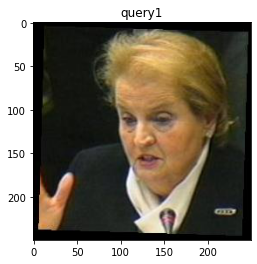

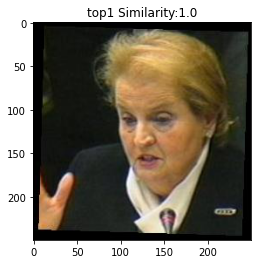

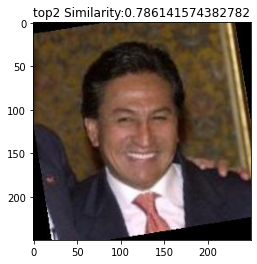

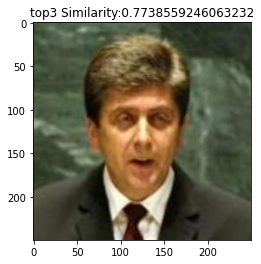

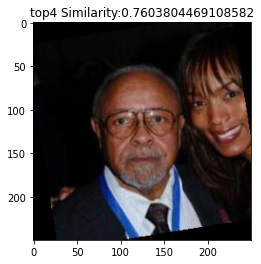

...

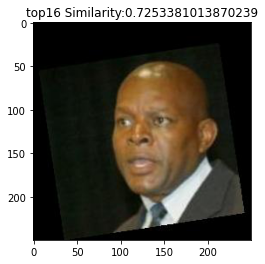

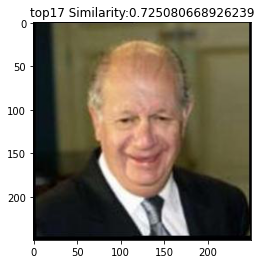

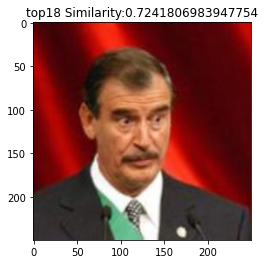

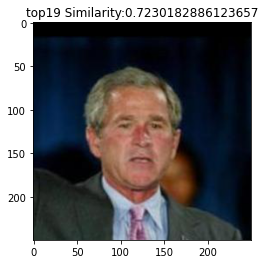

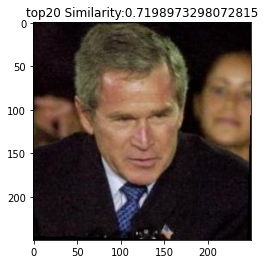

<Figure size 432x288 with 0 Axes>

In [43]:
ret(image_paths, 20, 1)

2091


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


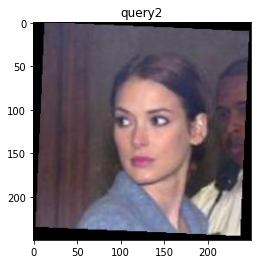

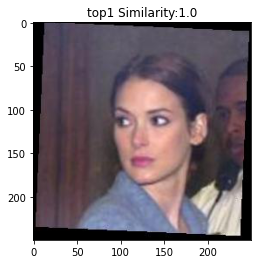

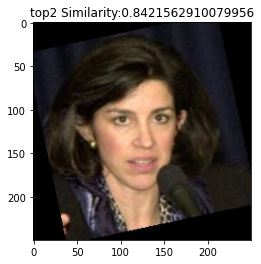

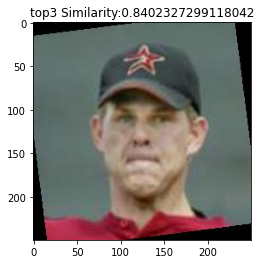

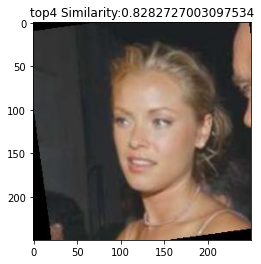

...

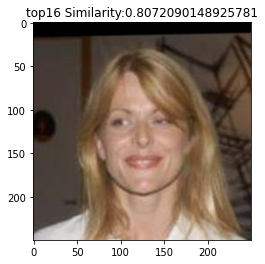

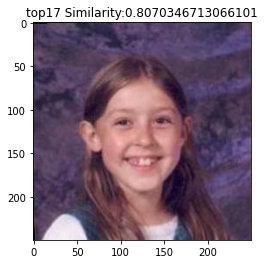

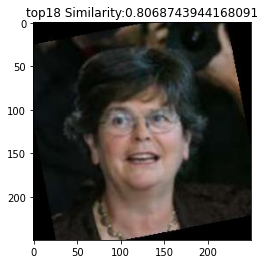

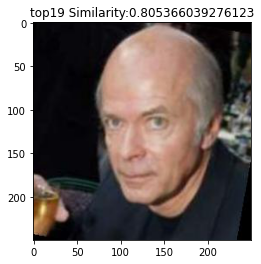

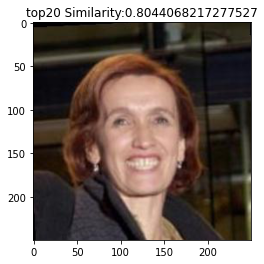

<Figure size 432x288 with 0 Axes>

In [38]:
ret(image_paths, 20, 2)

In [44]:
ret(image_paths, 20, 3)

Output hidden; open in https://colab.research.google.com to view.

11465


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


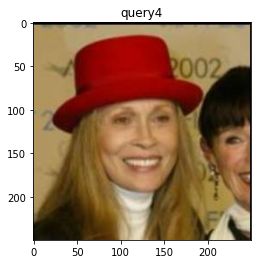

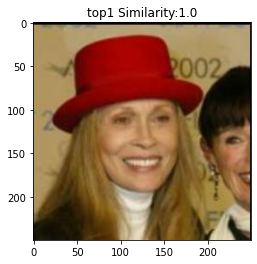

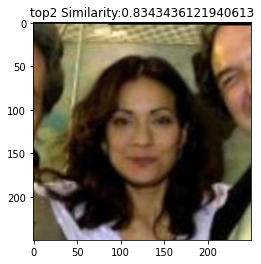

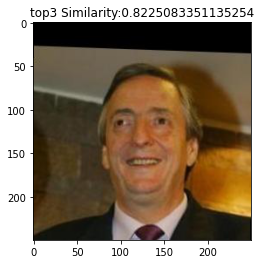

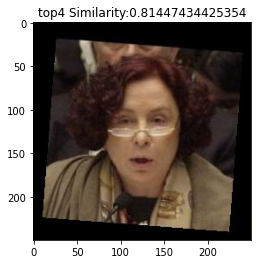

...

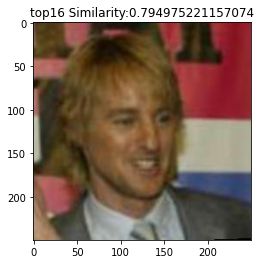

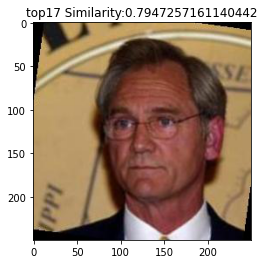

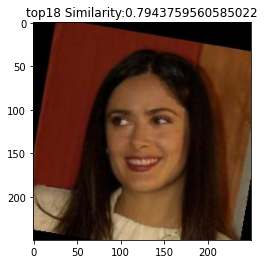

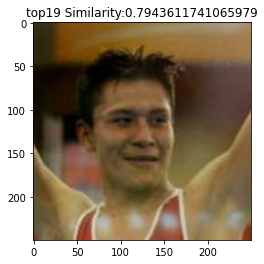

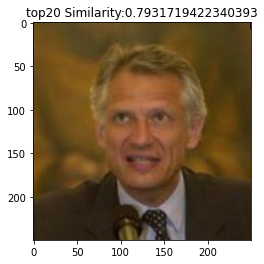

<Figure size 432x288 with 0 Axes>

In [45]:
ret(image_paths, 20, 4)

11093


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


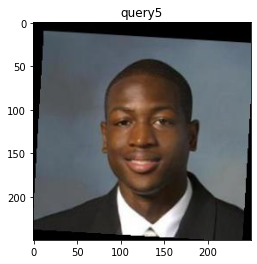

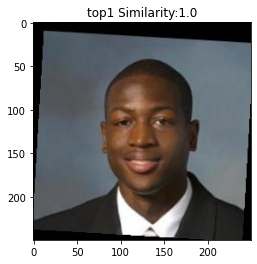

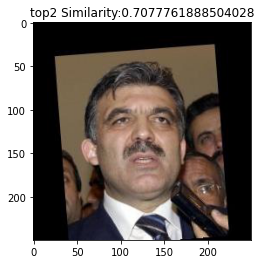

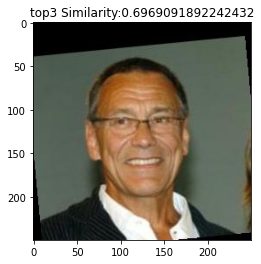

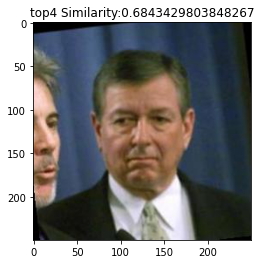

...

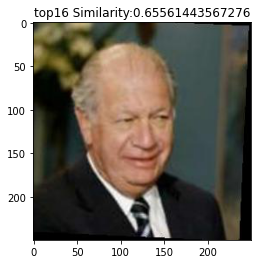

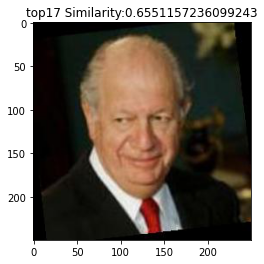

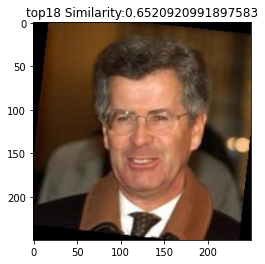

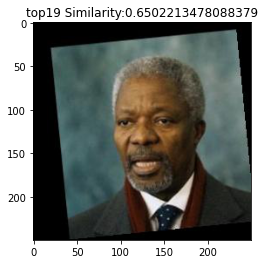

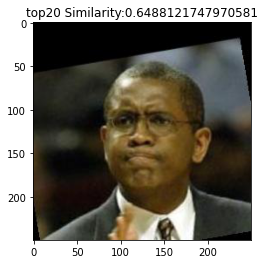

<Figure size 432x288 with 0 Axes>

In [31]:
ret(image_paths, 20, 5)

11964


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


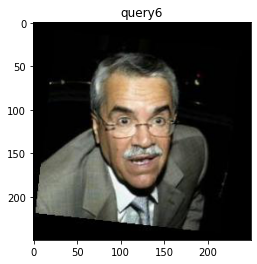

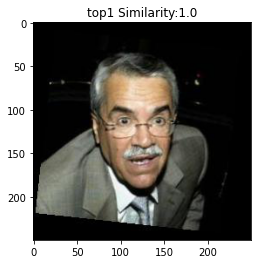

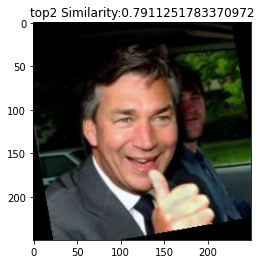

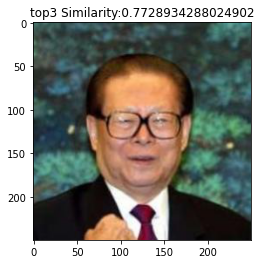

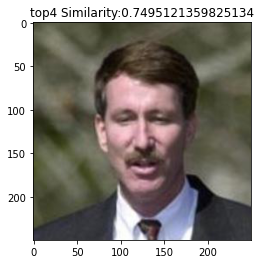

...

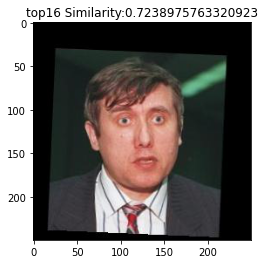

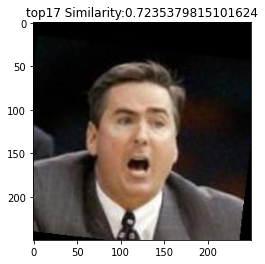

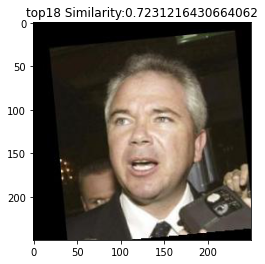

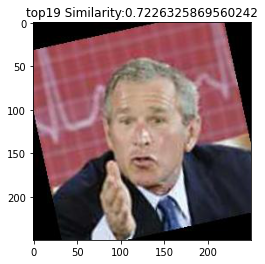

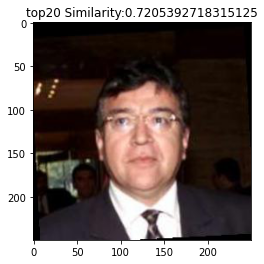

<Figure size 432x288 with 0 Axes>

In [40]:
ret(image_paths, 20, 6)

In [33]:
ret(image_paths, 20, 7)

Output hidden; open in https://colab.research.google.com to view.

3769


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


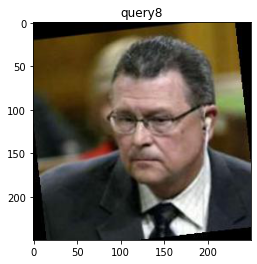

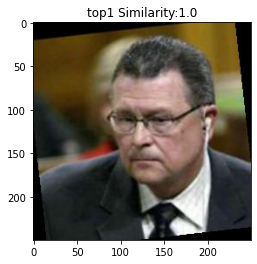

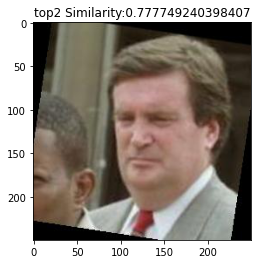

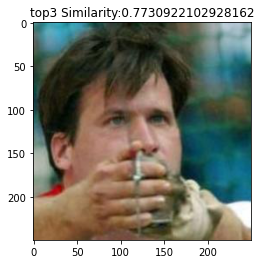

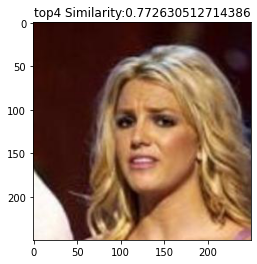

...

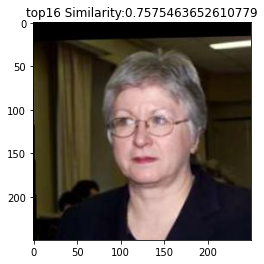

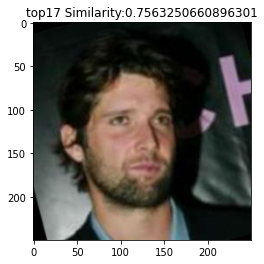

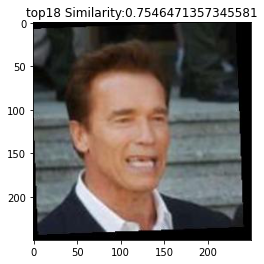

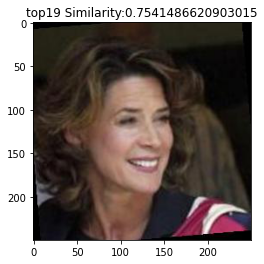

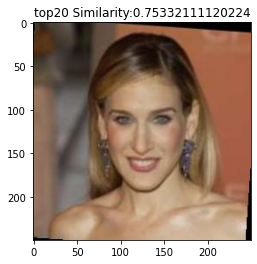

<Figure size 432x288 with 0 Axes>

In [41]:
ret(image_paths, 20, 8)

11912


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


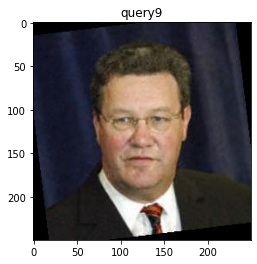

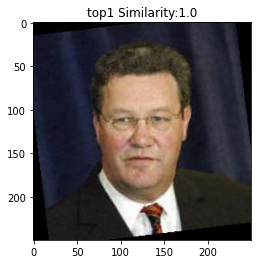

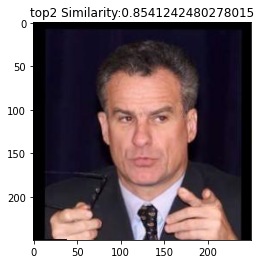

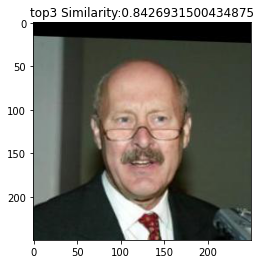

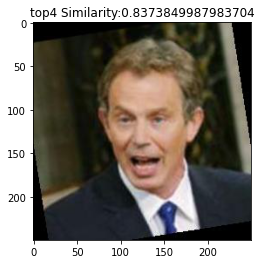

...

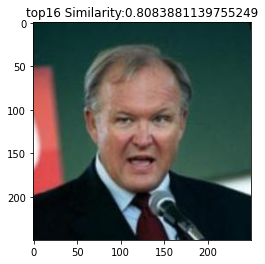

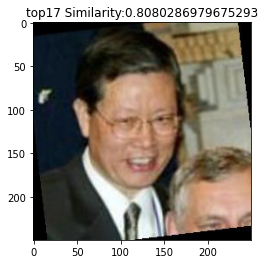

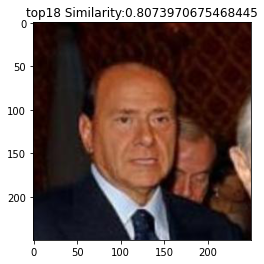

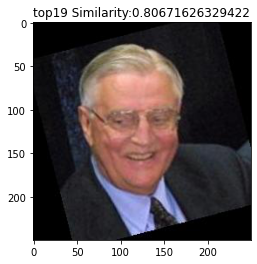

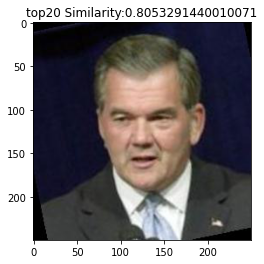

<Figure size 432x288 with 0 Axes>

In [46]:
ret(image_paths, 20, 9)

1245


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


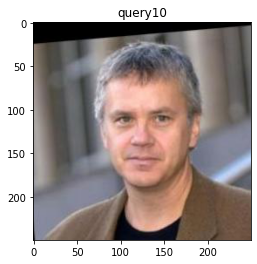

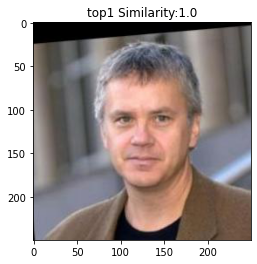

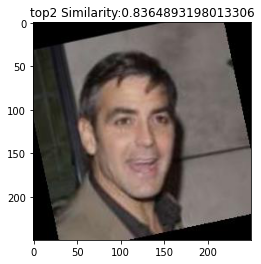

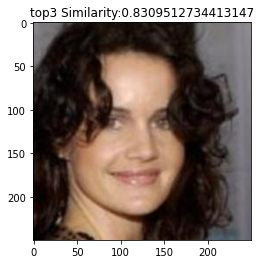

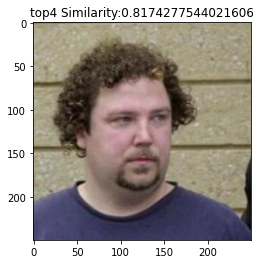

...

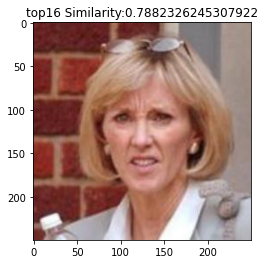

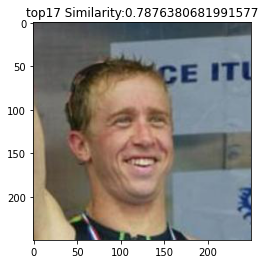

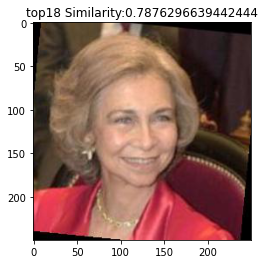

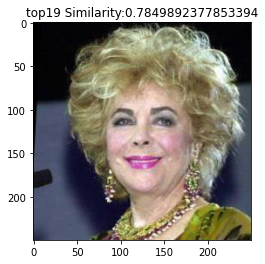

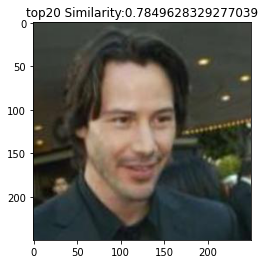

<Figure size 432x288 with 0 Axes>

In [48]:
ret(image_paths, 20, 10)